In [1]:
from collections import defaultdict
from pathlib import Path

import cv2
from tqdm import tqdm

import matplotlib.pyplot as plt
import numpy as np
import scipy.io as scio
from PIL import Image
import torch
from torch import nn, Tensor

from extension import utils
from segmentation.tree_segmentation.util import show_masks

from segmentation.segment_anything import build_sam_vit_h, SamPredictor
from segmentation.tree_segmentation import TreePredictor, TreeData, MaskData
from segmentation.tree_segmentation.tree_3d_segmentation import Tree3D
from segmentation.tree_segmentation.tree_3d import TreeSegment
from segmentation.tree_segmentation.metric import TreeSegmentMetric

%load_ext autoreload
%autoreload 2
%matplotlib inline
plt.rcParams['figure.dpi'] = 200
assert torch.cuda.is_available()
device = torch.device('cuda')

In [5]:
# load SAM
assert torch.cuda.is_available()
sam_pth = Path('~/models/sam_vit_h_4b8939.pth').expanduser()
sam = build_sam_vit_h(sam_pth).cuda()
predictor = SamPredictor(sam)
tree_seg = TreePredictor(sam, box_nms_thresh=0.7)

# Pascal VOC

Reference: `"Detect What You Can: Detecting and Representing Objects using Holistic Models and Body Parts", CVPR 2014`
Project home: http://roozbehm.info/pascal-parts/pascal-parts.html

有18个类, 每个类将物体分为一些部件


In [2]:
voc_part_root = Path('/data/VOC/Part2010/Annotations_Part')
voc_img_root = Path('/data/VOC/VOC2012/JPEGImages')
voc_ppart_root = Path('/data/VOC/panopticParts/labels')
voc_semantic_seg_root = Path('/data/VOC/VOC2012/SegmentationClassAug')
voc_instance_seg_root = Path('/data/VOC/VOC2012/SegmentationObject')

There are 10103 annotations
example: /data/VOC/Part2010/Annotations_Part/2008_003788.mat
data:  {'filename': '2008_003788', 'objects': [{'class': 'aeroplane', 'class_ind': numpy((1,), uint8), 'mask': numpy((333, 500), uint8), 'parts': [('body', numpy((333, 500), uint8)), ('lwing', numpy((333, 500), uint8)), ('engine_1', numpy((333, 500), uint8)), ('engine_2', numpy((333, 500), uint8)), ('wheel_1', numpy((333, 500), uint8)), ('wheel_2', numpy((333, 500), uint8)), ('wheel_3', numpy((333, 500), uint8)), ('wheel_4', numpy((333, 500), uint8)), ('stern', numpy((333, 500), uint8)), ('tail', numpy((333, 500), uint8))]}]}


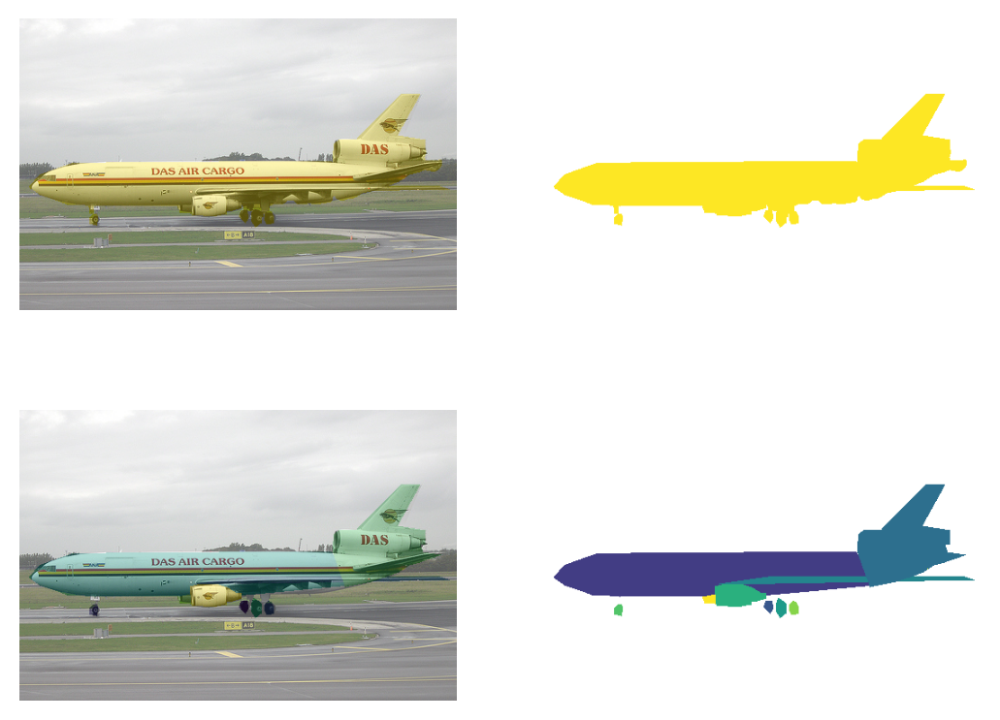

In [3]:
def load_voc_part_annotation(ann_file: Path):
    annotations = scio.loadmat(ann_file.as_posix())['anno'][0]
    assert len(annotations) == 1
    info = {
        'filename': annotations[0][0][0],
        'objects': []
    }
    objects = annotations[0][1][0]
    # print(f"{filename} have {len(objects)} objects")
    for obj in objects:
        info['objects'].append({
            'class': obj[0][0],
            'class_ind': obj[1][0],
            'mask': obj[2],
            'parts': [(part[0][0], part[1]) for part in obj[3][0]] if len(obj[3]) > 0 else []
        })
    # print(utils.show_shape(info))
    return info


voc_part_annotations = sorted(list(voc_part_root.glob('*.mat')))
print(f'There are {len(voc_part_annotations)} annotations')
example = np.random.choice(voc_part_annotations)
print(f'example: {example}')
data_example = load_voc_part_annotation(example)
print(f"data: ", utils.show_shape(data_example))

image = utils.load_image(voc_img_root.joinpath(data_example['filename'] + '.jpg'))
masks = [obj['mask'] for obj in data_example['objects']]
# plt.figure(dpi=300)
plt.subplot(221)
show_masks(image, *masks)
plt.subplot(222)
show_masks(None, *masks)
part_masks = []
for obj in data_example['objects']:
    part_masks.extend(part[1] for part in obj['parts'])
plt.subplot(223)
show_masks(image, *part_masks)
plt.subplot(224)
show_masks(None, *part_masks)
# data = []
# for ann_file in tqdm(ann_files):
#     data.append(info)
# print(utils.show_shape(data[0]))

VOC 2012 semantic segmentation have 12031 files
example: /data/VOC/VOC2012/SegmentationClassAug/2008_002813.png
mask: numpy((378, 500), uint8) [ 0 15]


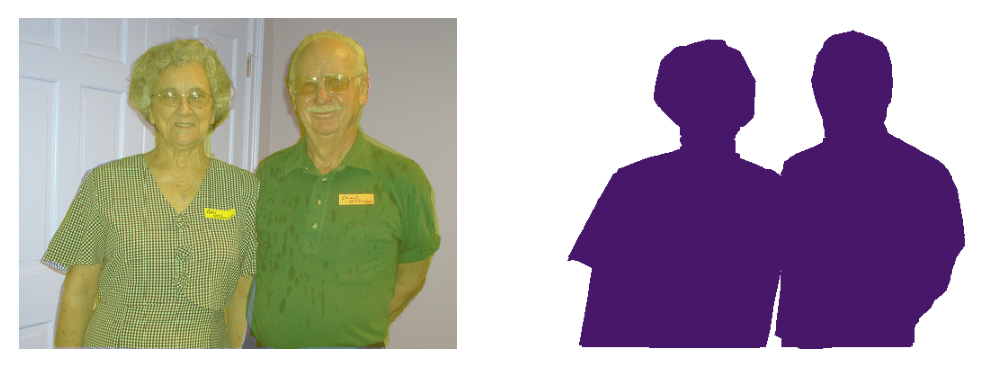

In [4]:
semantic_annotation_files = sorted(list(voc_semantic_seg_root.rglob('*.png')))
print(f'VOC 2012 semantic segmentation have {len(semantic_annotation_files)} files')

example = np.random.choice(semantic_annotation_files)  # type: Path
print('example:', example)
image = utils.load_image(voc_img_root.joinpath(example.name).with_suffix('.jpg'))
mask = utils.load_image(example)
print('mask:', utils.show_shape(mask), np.unique(mask))

plt.subplot(121)
show_masks(image, mask=mask)
plt.subplot(122)
show_masks(None, mask=mask)

VOC 2012 instance segmentation have 2913 files
example: /data/VOC/VOC2012/SegmentationObject/2008_002358.png
mask: numpy((333, 500), uint8) [  0   1 255]


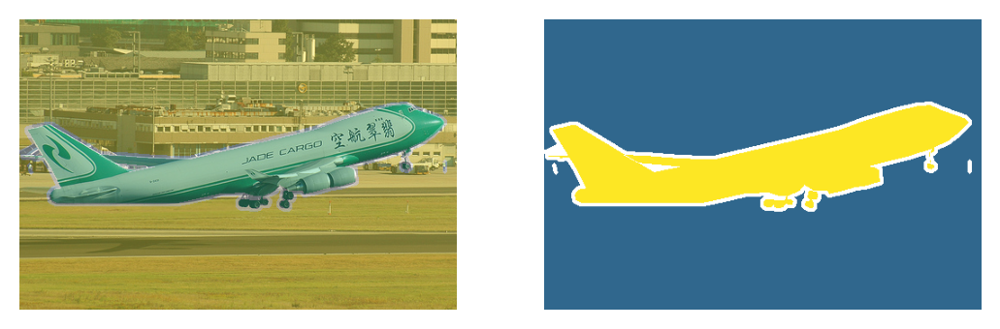

In [5]:
instance_annotation_files = sorted(list(voc_instance_seg_root.rglob('*.png')))
print(f'VOC 2012 instance segmentation have {len(instance_annotation_files)} files')

example = np.random.choice(instance_annotation_files)  # type: Path
print('example:', example)
image = utils.load_image(voc_img_root.joinpath(example.name).with_suffix('.jpg'))
mask = utils.load_image(example)
print('mask:', utils.show_shape(mask), np.unique(mask))
rmap = np.arange(256, dtype=np.uint8) + 1
mask = rmap[mask]

plt.subplot(121)
show_masks(image, mask=mask)
plt.subplot(122)
show_masks(None, mask=mask)

##  PASCAL-Panoptic-Parts
- Reference: `Part-aware Panoptic Segmentation, CVPR 2021`
- [Datasets Technical Report](https://arxiv.org/abs/2004.07944)
- 数据格式
    - 1-2 digit uids encode only semantic-level labels
    - 3-5 digit uids encode semantic-instance-level labels
    - 6-7 digit uids encode semantic-instance-parts-level labels
    - unlabeled / void / ignored / “do not care pixels”: sid=0/pid=0

There are 10103 anotations
example: /data/VOC/panopticParts/labels/training/2008_000028.tif
mask: numpy((375, 500), int32) [     0      7     34     58     74     81     84   7000   7001 700001
 700003 700005 700006 700007 700008 700020 700021 700022 700040 700102
 700104 700106 700109 700120 700121 700122 700140 700141]


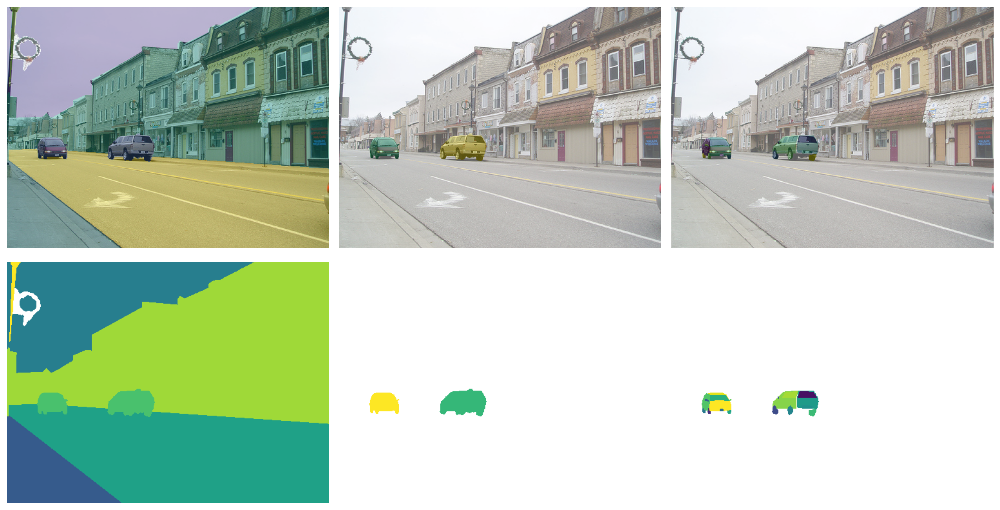

In [6]:
panoptic_parts_annotations = sorted(list(voc_ppart_root.rglob('*.tif')))
print(f'There are {len(panoptic_parts_annotations)} anotations')

# example = np.random.choice(panoptic_parts_annotations)
example = panoptic_parts_annotations[4]
print('example:', example)
# noinspection PyTypeChecker
mask = np.array(Image.open(example))
print('mask:', utils.show_shape(mask), np.unique(mask))
image = utils.load_image(voc_img_root.joinpath(example.stem + '.jpg'))


def ppart_convert_mask(mask: np.ndarray):
    fm1_mask = mask < 100  # only semantic-level labels
    fm2_mask = (mask < 100000) & (mask >= 100)  # semantic-level label and semantic-instance-level labels
    fm3_mask = mask >= 100000

    sid = np.where(fm1_mask, mask, np.where(fm3_mask, mask // 100000, mask // 1000))
    map_index = np.zeros(sid.max() + 1, dtype=np.int32)
    uni = np.unique(sid)
    map_index[uni] = np.arange(len(uni)) + (uni[0] > 0)
    sid = map_index[sid]

    iid = np.where(fm1_mask, 0, np.where(fm3_mask, mask // 100 % 1000, mask % 1000))
    num_max_instance = iid.max() + 1
    iid = sid * num_max_instance + iid
    map_index = np.zeros(iid.max() + 1, dtype=np.int32)
    uni = np.unique(iid)
    map_index[uni] = np.arange(len(uni)) + (uni[0] > 0)
    iid = map_index[iid]

    pid = np.where(fm3_mask, mask % 100, 0)
    num_max_part = pid.max() + 1
    pid = iid * num_max_part + pid
    map_index = np.zeros(pid.max() + 1, dtype=np.int32)
    uni = np.unique(pid)
    map_index[uni] = np.arange(len(uni)) + (uni[0] > 0)
    pid = map_index[pid]
    return sid, iid * np.logical_not(fm1_mask), pid * fm3_mask
    # return sid, iid, pid


mask_1, mask_2, mask_3 = ppart_convert_mask(mask)
plt.figure(figsize=(5 * 3, 4 * 2))
plt.subplot(231)
show_masks(image, mask=mask_1)
plt.subplot(234)
show_masks(None, mask=mask_1)
plt.subplot(232)
show_masks(image, mask=mask_2)
plt.subplot(235)
show_masks(None, mask=mask_2)
plt.subplot(233)
show_masks(image, mask=mask_3)
plt.subplot(236)
show_masks(None, mask=mask_3)
plt.tight_layout()

There are 2777 results
There are 1000 results after fileter


  0%|          | 0/1000 [00:00<?, ?it/s]

1 tensor([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
        19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36,
        37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51],
       device='cuda:0', dtype=torch.int32) tensor([1, 2, 3, 4, 5, 6], device='cuda:0', dtype=torch.int32)
level 1, num_prediction=51, num_gt=6


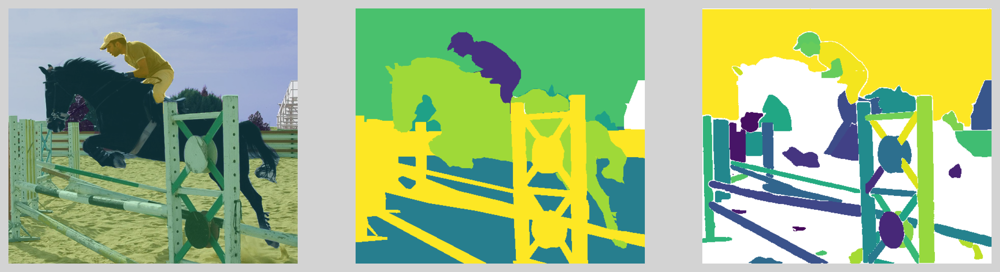

2 tensor([52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69,
        70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85],
       device='cuda:0', dtype=torch.int32) tensor([ 7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24,
        25], device='cuda:0', dtype=torch.int32)
level 2, num_prediction=34, num_gt=19


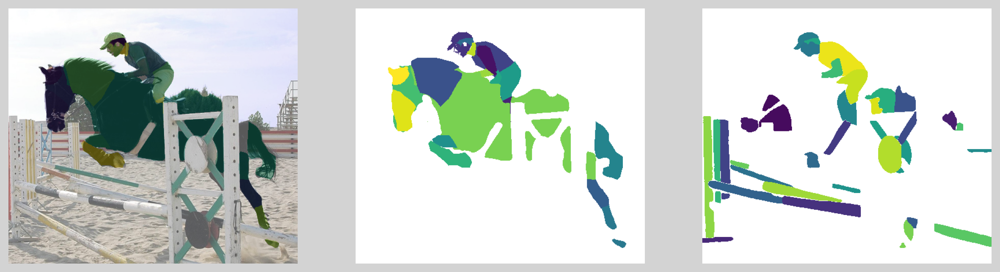

3 tensor([86, 87, 88, 89, 90, 91], device='cuda:0', dtype=torch.int32) []
level 3, num_prediction=6, num_gt=0


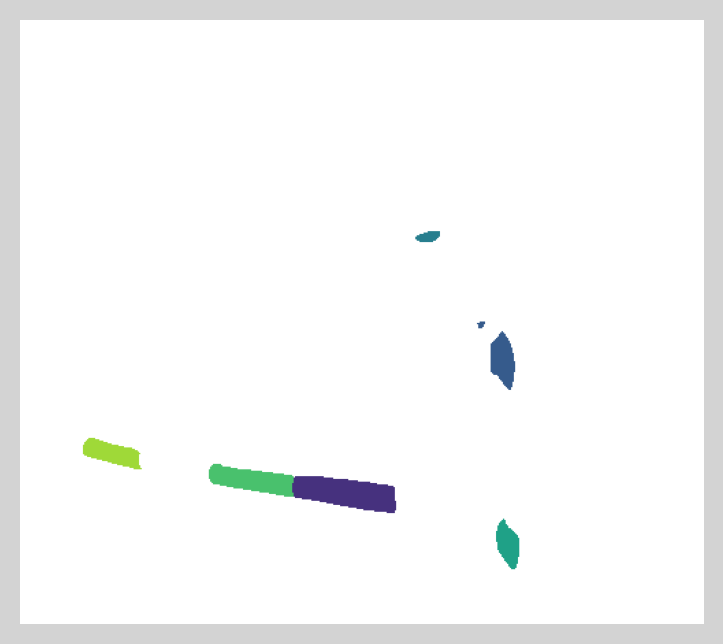

100%|██████████| 1000/1000 [16:21<00:00,  1.02it/s] 

score: 0.18074014792656953


In [7]:
results_root = Path('/home/wan/wan_code/segmentation/segment_anything/results/VOC')
filenames = sorted(list(results_root.glob('*.tree2d')))
print(f'There are {len(filenames)} results')
ppart_map = {path.stem: path for path in panoptic_parts_annotations}
filenames = [filename for filename in filenames if filename.stem in ppart_map][:1000]
print(f'There are {len(filenames)} results after fileter')

eval_metric = TreeSegmentMetric()
for step, filename in enumerate(tqdm(filenames)):
    tree2d = TreeData(device=device)
    tree2d.load(filename)

    # noinspection PyTypeChecker
    mask = np.array(Image.open(ppart_map[filename.stem]))
    gt_masks = []
    for mask in ppart_convert_mask(mask):
        for i in np.unique(mask):
            if i == 0:
                continue
            gt_masks.append(mask == i)
    gt_masks = np.stack(gt_masks)
    gt = TreeData(MaskData(masks=torch.from_numpy(gt_masks).cuda(), iou_preds=torch.ones(len(gt_masks))), device=device)
    gt.update_tree()
    gt.remove_not_in_tree()

    eval_metric.update(tree2d, gt)
    # print(eval_metric.cnt, eval_metric.sum)

    if step == 0:
        # tree2d.print_tree()
        image = utils.load_image(voc_img_root.joinpath(filename.stem + '.jpg'))
        pd_levels = tree2d.get_levels()
        gt_levels = gt.get_levels()
        for level in range(max(len(pd_levels), len(gt_levels))):
            if level == 0:
                continue
            fig = plt.figure(figsize=(15, 5))
            fig.patch.set_facecolor('lightgray')
            pd_level_i = pd_levels[level] if level < len(pd_levels) else []
            gt_level_i = gt_levels[level] if level < len(gt_levels) else []
            print(level, pd_level_i, gt_level_i)
            print(f"level {level}, num_prediction={len(pd_level_i)}, num_gt={len(gt_level_i)}")
            if len(gt_level_i) > 0:
                plt.subplot(131)
                show_masks(image, gt.data['masks'][gt_level_i - 1])
            if len(gt_level_i) > 0:
                plt.subplot(132)
                show_masks(None, gt.data['masks'][gt_level_i - 1])
            if len(pd_level_i) > 0:
                plt.subplot(133)
                show_masks(None, tree2d.data['masks'][pd_level_i - 1])
            plt.show()
    # break
print('score:', eval_metric.summarize())

# CityScapes

There are 3475 annotations
example: /data5/Cityscapes/gtFinePanopticParts/train/bremen/bremen_000167_000019_gtFinePanopticParts.tif
mask: numpy((1024, 2048), int32) [      1       3       4       5       7       8      11      12      13
      17      21      23      26   30000   32000 2600001 2600002 2600003
 2600005 2600101 2600105 2600201 2600202 2600203 2600204 2600205 2600301
 2600302 2600303 2600304 2600305 2600401 2600402 2600404 2600405 2600501
 2600502 2600503 2600505 2600601 2600602 2600603 2600604 2600605 2600701
 2600702 2600703 2600705 2600801 2600802 2600803 2600804 2600805]


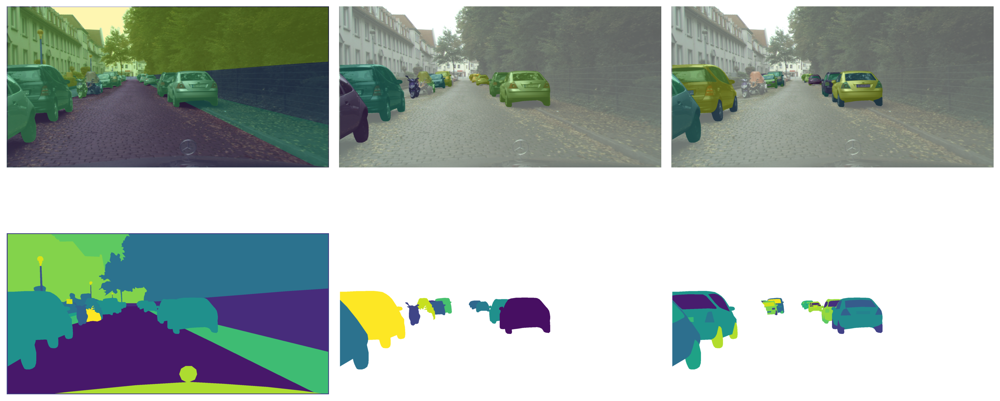

In [7]:
cityscapes_ppart_root = Path('/data5/Cityscapes/gtFinePanopticParts')
cityscapes_image_root = Path('/data5/Cityscapes/images')
city_annotations = sorted(list(cityscapes_ppart_root.rglob('*.tif')))
city_image_paths = {path.stem: path for path in cityscapes_image_root.rglob('*.png')}
print(f'There are {len(city_annotations)} annotations')
example = np.random.choice(city_annotations)
print('example:', example)
image_path = city_image_paths[example.stem[:-len('_gtFinePanopticParts')]]
assert image_path.exists(), image_path

# noinspection PyTypeChecker
mask = np.array(Image.open(example))
print('mask:', utils.show_shape(mask), np.unique(mask))

image = utils.load_image(image_path)
mask_1, mask_2, mask_3 = ppart_convert_mask(mask)
plt.figure(figsize=(5 * 3, 4 * 2))
plt.subplot(231)
show_masks(image, mask=mask_1)
plt.subplot(234)
show_masks(None, mask=mask_1)
plt.subplot(232)
show_masks(image, mask=mask_2)
plt.subplot(235)
show_masks(None, mask=mask_2)
plt.subplot(233)
show_masks(image, mask=mask_3)
plt.subplot(236)
show_masks(None, mask=mask_3)
plt.tight_layout()

There are 1000 results


  0%|          | 0/1000 [00:00<?, ?it/s]

/home/wan/wan_code/segmentation/segment_anything/results/Cityscapes/aachen_000000_000019.tree2d /data5/Cityscapes/images/train/aachen_000000_000019.png /data5/Cityscapes/gtFinePanopticParts/train/aachen/aachen_000000_000019_gtFinePanopticParts.tif
1 tensor([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
        19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36,
        37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54,
        55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72,
        73, 74, 75, 76, 77, 78], device='cuda:0', dtype=torch.int32) tensor([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15],
       device='cuda:0', dtype=torch.int32)
level 1, num_prediction=78, num_gt=15


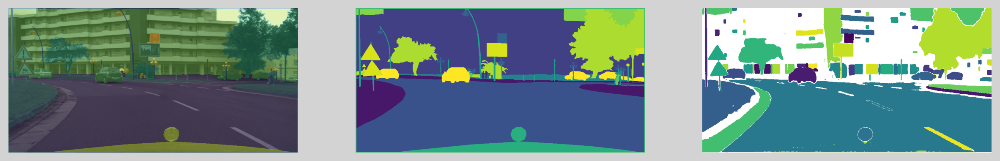

2 tensor([ 79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,  92,
         93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104, 105, 106,
        107, 108, 109, 110, 111, 112, 113], device='cuda:0', dtype=torch.int32) tensor([16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29],
       device='cuda:0', dtype=torch.int32)
level 2, num_prediction=35, num_gt=14


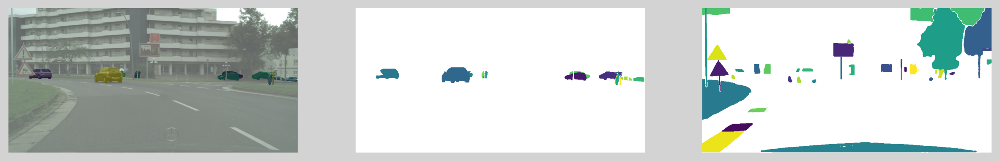

3 tensor([114, 115, 116, 117, 118, 119, 120, 121], device='cuda:0',
       dtype=torch.int32) tensor([30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45],
       device='cuda:0', dtype=torch.int32)
level 3, num_prediction=8, num_gt=16


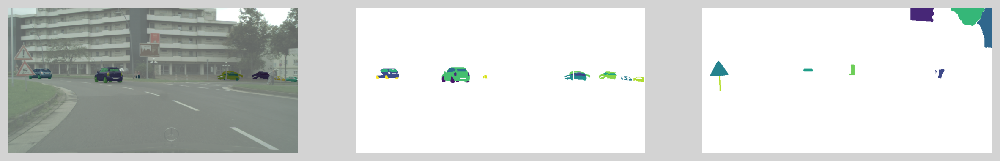

4 tensor([122, 123, 124, 125], device='cuda:0', dtype=torch.int32) []
level 4, num_prediction=4, num_gt=0


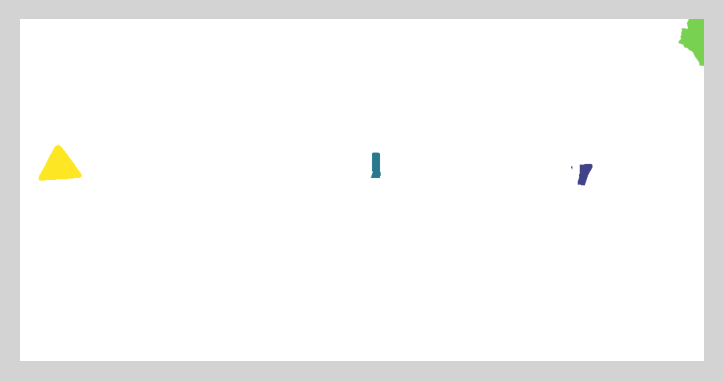

100%|██████████| 1000/1000 [18:56<00:00,  1.14s/it]

score: 0.14310107137004838


In [15]:
results_root = Path('/home/wan/wan_code/segmentation/segment_anything/results/Cityscapes')
filenames = sorted(list(results_root.glob('*.tree2d')))[:1000]

print(f'There are {len(filenames)} results')
city_annotation_paths = {path.stem[:len('_gtFinePanopticParts')]: path for path in city_annotations}

eval_metric = TreeSegmentMetric()
for step, filename in enumerate(tqdm(filenames)):
    if filename.stem not in city_annotation_paths:
        continue
    tree2d = TreeData(device=device)
    tree2d.load(filename)

    mask = np.array(Image.open(city_annotation_paths[filename.stem]))
    mask = cv2.resize(mask, (1024, 512), interpolation=cv2.INTER_NEAREST)
    gt_masks = []
    for mask in ppart_convert_mask(mask):
        for i in np.unique(mask):
            if i == 0:
                continue
            gt_masks.append(mask == i)
    gt_masks = np.stack(gt_masks)
    gt = TreeData(MaskData(masks=torch.from_numpy(gt_masks).cuda(), iou_preds=torch.ones(len(gt_masks))), device=device)
    gt.update_tree()
    gt.remove_not_in_tree()

    eval_metric.update(tree2d, gt)
    # print(eval_metric.cnt, eval_metric.sum)

    if step == 0:
        # tree2d.print_tree()
        print(filename, city_image_paths[filename.stem], city_annotation_paths[filename.stem])
        image = utils.load_image(city_image_paths[filename.stem])
        image = cv2.resize(image, (1024, 512), interpolation=cv2.INTER_AREA)

        pd_levels = tree2d.get_levels()
        gt_levels = gt.get_levels()
        for level in range(max(len(pd_levels), len(gt_levels))):
            if level == 0:
                continue
            fig = plt.figure(figsize=(15, 5))
            fig.patch.set_facecolor('lightgray')
            pd_level_i = pd_levels[level] if level < len(pd_levels) else []
            gt_level_i = gt_levels[level] if level < len(gt_levels) else []
            print(level, pd_level_i, gt_level_i)
            print(f"level {level}, num_prediction={len(pd_level_i)}, num_gt={len(gt_level_i)}")
            if len(gt_level_i) > 0:
                plt.subplot(131)
                show_masks(image, gt.data['masks'][gt_level_i - 1])
            if len(gt_level_i) > 0:
                plt.subplot(132)
                show_masks(None, gt.data['masks'][gt_level_i - 1])
            if len(pd_level_i) > 0:
                plt.subplot(133)
                show_masks(None, tree2d.data['masks'][pd_level_i - 1])
            plt.show()
    # break
print('score:', eval_metric.summarize())

# CelebAMask-HQ

In [3]:
face_dataset_root = Path('/data6/CelebAMask-HQ')
face_img_root = face_dataset_root.joinpath('CelebA-HQ-img')
face_part_root = face_dataset_root.joinpath('CelebAMask-HQ-mask-anno')

face_data = defaultdict(list)
for part_filepath in face_part_root.rglob('*_*.png'):
    image_id = int(part_filepath.name.split('_')[0])
    face_data[image_id].append(part_filepath.name)
    assert int(part_filepath.parts[-2]) == image_id // 2000
print(f'There are {len(face_data)} images')

There are 30000 images


index=4221
13 numpy((512, 512, 3), uint8) [  0 255]
image: numpy((512, 512, 3), uint8)


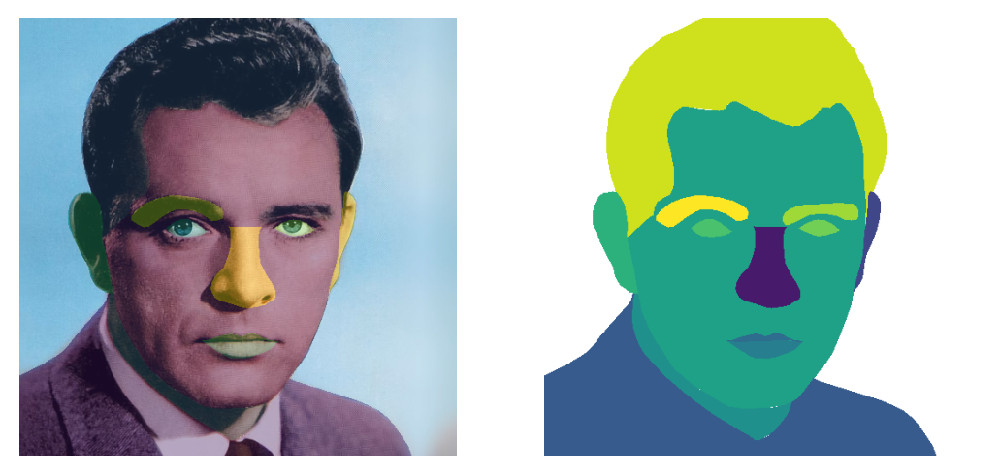

In [87]:
index = np.random.randint(30000)
print(f"index={index}")
parts = [utils.load_image(face_part_root.joinpath(f"{index // 2000}", part_name)) for part_name in face_data[index]]
print(len(parts), utils.show_shape(parts[0]), np.unique(parts[0]))
parts = [part[:, :, 0] > 0 for part in parts]
parts = sorted(parts, key=lambda part: -part.sum())

image = utils.load_image(face_img_root.joinpath(f"{index}.jpg"))
image = cv2.resize(image, (parts[0].shape[1], parts[0].shape[0]))
print('image:', utils.show_shape(image))

plt.subplot(121)
show_masks(image, *parts)
plt.subplot(122)
show_masks(None, *parts)

complete init segmentation
complete iter 0 update segmentation
complete iter 1 update segmentation
complete iter 2 update segmentation
complete iter 3 update segmentation
complete iter 4 update segmentation
complete iter 5 update segmentation
complete iter 6 update segmentation
complete iter 7 update segmentation
complete iter 8 update segmentation
complete iter 9 update segmentation
complete iter 10 update segmentation
BoolTensor[18, 512, 512]
level 1, num=3:


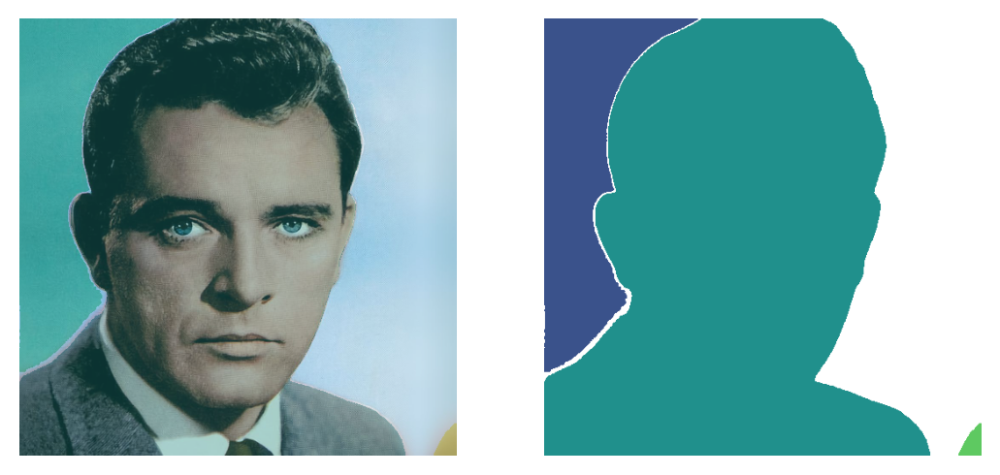

level 2, num=5:


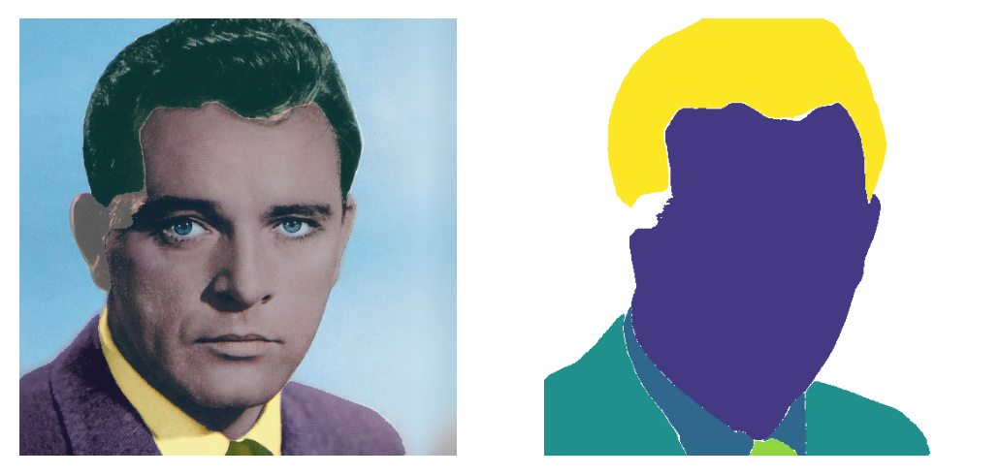

level 3, num=10:


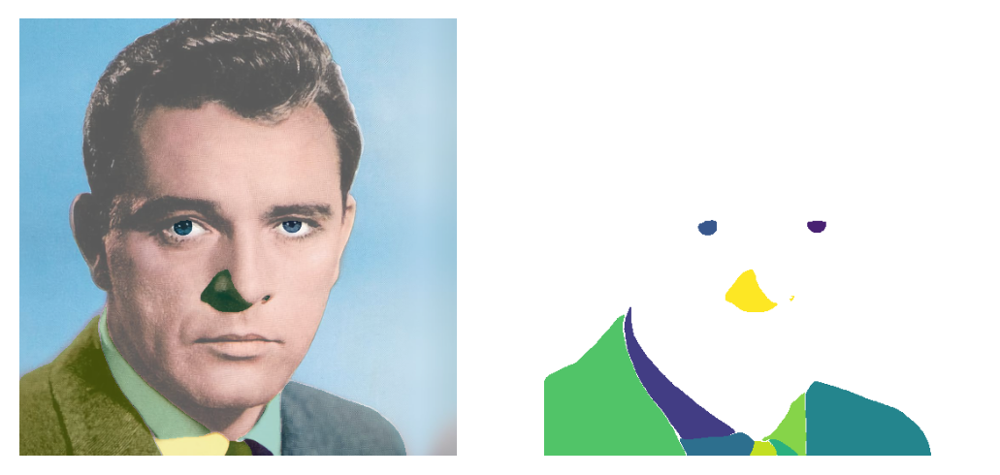

In [89]:
tree_data = tree_seg.generate(image,
    max_iters=100,
    in_threshold=0.9,
    union_threshold=0.1,
    min_mask_region_area=100,
    points_per_update=256,
    device=device,
    in_thre_area=50,
)
print(utils.show_shape(tree_data.data['masks']))
for level, nodes in enumerate(tree_data.get_levels()):
    if level == 0:
        continue
    # plt.figure(figsize=(10, 5))
    print(f"level {level}, num={len(nodes)}:")
    plt.subplot(121)
    show_masks(image, tree_data.data['masks'][nodes - 1])
    plt.subplot(122)
    show_masks(None, tree_data.data['masks'][nodes - 1])
    plt.show()

# Metric

[1.0295 1.0204 1.0182 1.0161 0.9884 0.9872 0.9815 0.9804 0.9787 0.9759 0.9636 0.9624 0.958  0.9557 0.9515 0.9508 0.9244 0.9228]


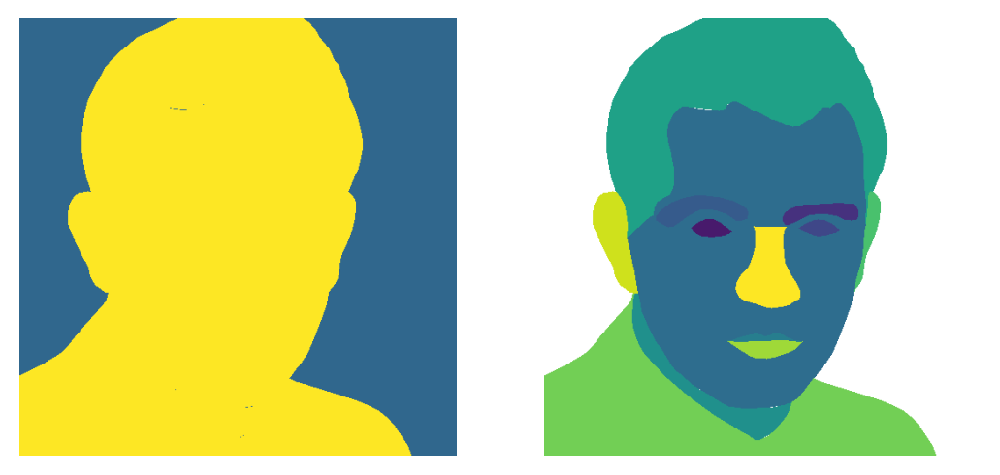

In [90]:
predictions = tree_data.data['masks'].cpu().numpy()
scores = tree_data.data['iou_preds'].cpu().numpy()
order = scores.argsort()[::-1]
print(scores[order])
predictions = predictions[order]

gt = np.stack(parts)
foreground = gt.sum(axis=0) > 0
gt = np.concatenate([foreground[None], np.logical_not(foreground)[None], gt], axis=0)

plt.subplot(121)
show_masks(None, gt[:2])
plt.subplot(122)
show_masks(None, gt[2:])

## match prediction, calculate IoU

[[0.9885 0.0002 0.4855 0.2437 0.2196 0.0302 0.029  0.0201 0.0133 0.0084 0.0078 0.0067 0.0042 0.0037 0.003 ]
 [0.157  0.     0.     0.     0.7038 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
 [0.5143 0.0002 0.9146 0.0072 0.0034 0.0571 0.0557 0.0004 0.0252 0.0162 0.015  0.0121 0.008  0.0071 0.0058]
 [0.2252 0.0001 0.0009 0.9146 0.     0.     0.     0.0005 0.     0.     0.     0.0011 0.     0.     0.    ]
 [0.0573 0.     0.     0.     0.2569 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
 [0.0998 0.     0.     0.     0.4476 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
 [0.0026 0.     0.     0.     0.0117 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
 [0.0525 0.     0.     0.     0.2355 0.0033 0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
 [0.0107 0.     0.0223 0.     0.     0.     0.2072 0.     0.     0.     0.     0.     0.     0.     0.    ]
 [0.0048 0.     0.     0.   

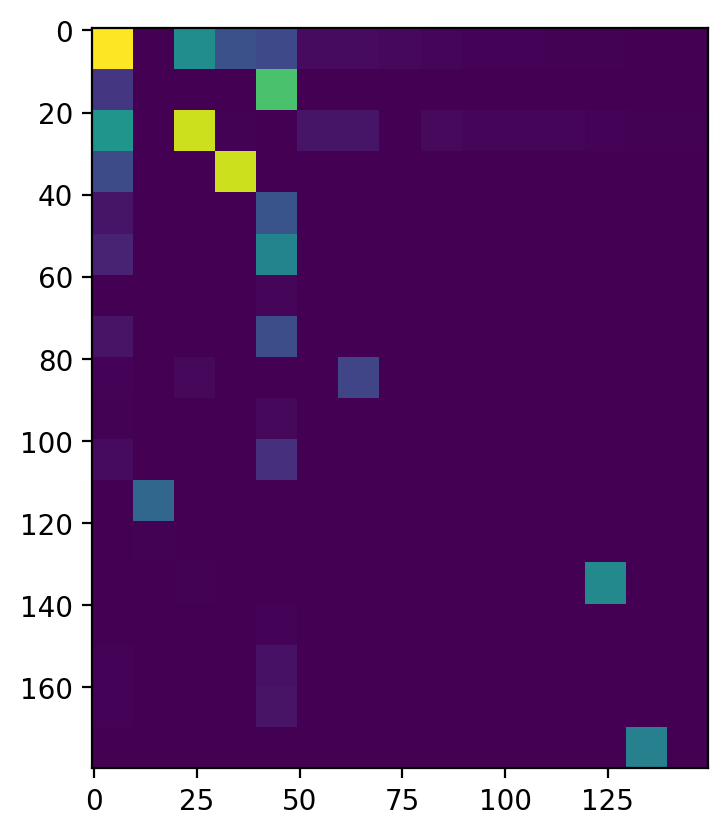

[ 0  4  2  3 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1] [ 0 -1  2  3  1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1]


In [91]:
iou_threshold = 0.5

N, M = predictions.shape[0], gt.shape[0]
intersections = (predictions[:, None, :, :] & gt[None, :, :, :]).reshape(N, M, -1).sum(axis=-1)
IoU = intersections / (predictions.reshape(N, 1, -1).sum(axis=-1) + gt.reshape(1, M, -1).sum(axis=-1) - intersections)
utils.set_printoptions(predictions=4)
print(IoU)
plt.imshow(np.repeat(np.repeat(IoU, 10, 0), 10, 1))
plt.show()
match_p, match_g = np.full(N, -1), np.full(M, -1)
for index in np.argsort(-IoU.reshape(-1)):
    p, g = index // M, index % M
    if IoU[p, g] < iou_threshold:
        break
    if match_p[p] < 0 and match_g[g] < 0:
        match_p[p] = g
        match_g[g] = p
print(match_p, match_g)

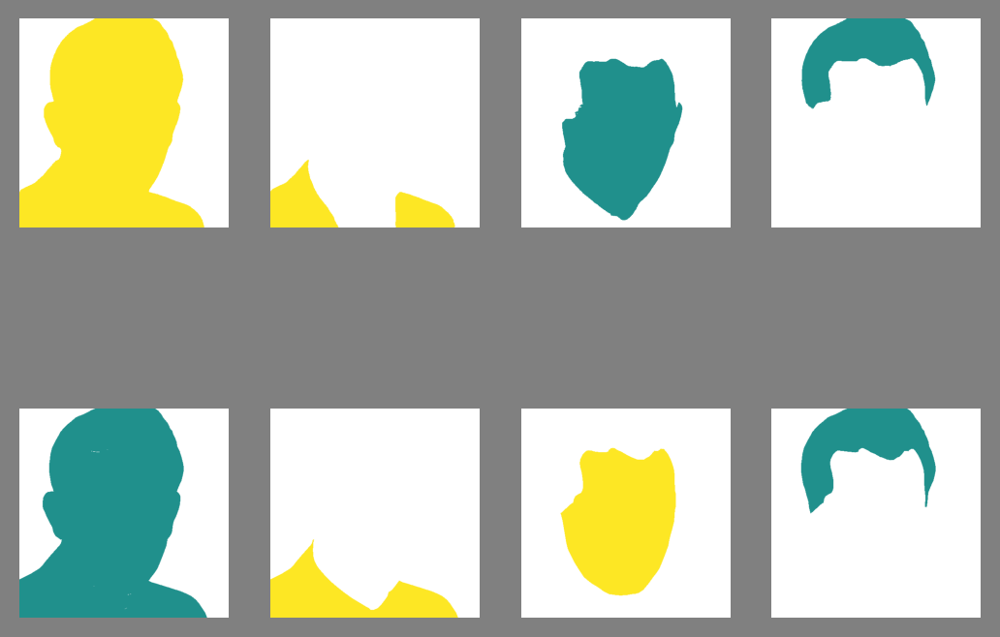

In [92]:
num = (match_p >= 0).sum()
cnt = 1
fig = plt.figure(dpi=200)
fig.patch.set_facecolor('gray')
for p in range(match_p.shape[0]):
    g = match_p[p]
    if g >= 0:
        ax = plt.subplot(2, num, cnt)
        show_masks(None, predictions[p])
        plt.subplot(2, num, cnt + num)
        show_masks(None, gt[g])
        cnt += 1

mAP: 0.26666666666666666


(0.0, 1.0)

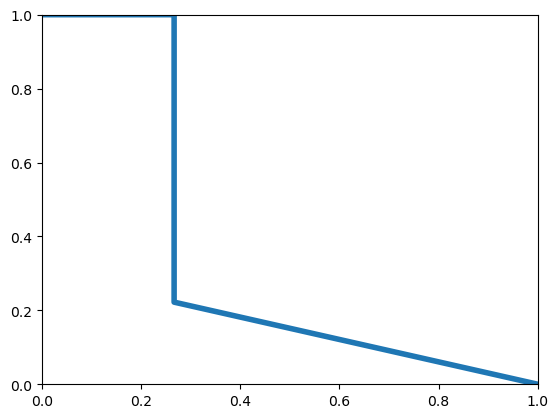

In [93]:
tp = match_p >= 0
precision = np.cumsum(tp) / (np.arange(len(tp)) + 1)
recall = np.cumsum(tp) / len(match_g)
recall = np.concatenate(([0.], recall, [1.]))
precision = np.concatenate(([0.], precision, [0.]))
# compute the precision envelope
for i in range(precision.size - 1, 0, -1):
    precision[i - 1] = np.maximum(precision[i - 1], precision[i])
# to calculate area under PR curve, look for points
# where X axis (recall) changes value
i = np.where(recall[1:] != recall[:-1])[0]

# and sum (\Delta recall) * prec
ap = np.sum((recall[i + 1] - recall[i]) * precision[i + 1])
print('mAP:', ap)
plt.figure(dpi=100)
plt.plot(recall, precision, lw=4)
plt.xlim(0, 1)
plt.ylim(0, 1)

## PQ
$$PQ = \frac{\sum_{(p,q) \in TP}IoU(p, g)}{|TP|} \times \frac{|TP|}{|TP|+0.5|FP|+0.5|FN|}  $$

In [94]:
p = np.nonzero(tp)[0]
g = match_p[p]
print(p, g, IoU[p, g])
TP = tp.sum()
PQ = IoU[p, g].sum() / (TP + 0.5 * (len(match_p - TP)) + 0.5 * (len(match_g) - TP))
print('PQ:', PQ)

[0 1 2 3] [0 4 2 3] [0.9885 0.7038 0.9146 0.9146]
PQ: 0.19035228586506497


# Part-PQ
对每个scence-level 类:
$$PartPQ= \frac{\sum_{(p,g)\in TP} {\mathrm{IoU}_p(p,g)}}{|TP|+0.5|FP|+0.5|FN|}, \mathrm{IoU}_p(p,g) = \left\{\begin{array}{ll}
\mathrm{mean}{\mathrm{IoU}_{part}(p, g)}, & l \in \mathcal{L}^{parts} \\
\mathrm{IoU}_{inst} (p, g),  & l \in \mathcal{L}^{non-parts} \\
\end{array}\right. $$

# Tree-aware Panoptic Quality
- 两个mask间评价指标: $\mathrm{IoU}(p, g)$
- 如果$p_1, p_2, \dots, p_n$和$g_1, g_2, \dots, g_m$都属于同一个结点的子孙, 评价指标可以用: $PQ$
- 对于GT, 同一层之间的两个mask互不重叠, 因此有且只有一个mask $g$使得 $\mathrm{In}(p, g) = \frac{\mathrm{area}(p \cap g)}{\mathrm{area}(p)} \ge 0.5$
    故预测$p$所属的子树为$g^* = \mathop{\arg\max}_{g |\mathrm{In}(p, g) \ge 0.5}{\mathrm{IoU}(p, g)}$
- 对于一个子树, 根节点为$g$, 有$p_1, p_2, \dots$与$g$对应, $g$的儿子结点为$c_1, c_2, \dots$, 对应的分数为$s_1, s_2, \dots$, 则该子树的分数为
    $$s_p = $$

In [33]:
results_root = Path('/home/wan/wan_code/segmentation/segment_anything/results/CelebAMask-HQ')
filenames = sorted(list(results_root.glob('*.tree2d')))
print(f'There are {len(filenames)} results')

eval_metric = TreeSegmentMetric()
for i, filename in enumerate(tqdm(filenames)):
    tree2d = TreeData(device=device)
    tree2d.load(filename)
    # tree2d.print_tree()

    index = int(filename.stem)
    parts = [utils.load_image(face_part_root.joinpath(f"{index // 2000}", part_name)) for part_name in face_data[index]]
    # print(len(parts), utils.show_shape(parts[0]), np.unique(parts[0]))
    parts = [part[:, :, 0] > 0 for part in parts]
    # parts = sorted(parts, key=lambda part: -part.sum())
    gt = np.stack(parts)
    foreground = gt.sum(axis=0) > 0
    gt = np.concatenate([foreground[None], np.logical_not(foreground)[None], gt], axis=0)
    gt = np.repeat(gt, 2, axis=1).repeat(2, axis=2)
    gt = TreeData(MaskData(masks=torch.from_numpy(gt).to(device), iou_preds=torch.ones(len(gt), device=device)),
        device=device)
    gt.update_tree()
    gt.remove_not_in_tree()

    eval_metric.update(tree2d, gt)
    # print(eval_metric.cnt, eval_metric.sum)

    # image = utils.load_image(face_img_root.joinpath(f"{index}.jpg"))
    # for level, nodes in enumerate(gt.get_levels()):
    #     if level == 0:
    #         continue
    #     # plt.figure(figsize=(10, 5))
    #     print(f"level {level}, num={len(nodes)}:")
    #     plt.subplot(121)
    #     show_masks(image, gt.data['masks'][nodes - 1])
    #     plt.subplot(122)
    #     show_masks(None, gt.data['masks'][nodes - 1])
    #     plt.show()
    # for level, nodes in enumerate(tree2d.get_levels()):
    #     if level == 0:
    #         continue
    #     # plt.figure(figsize=(10, 5))
    #     print(f"level {level}, num={len(nodes)}:")
    #     plt.subplot(121)
    #     show_masks(image, tree2d.data['masks'][nodes - 1])
    #     plt.subplot(122)
    #     show_masks(None, tree2d.data['masks'][nodes - 1])
    #     plt.show()
    # break
print('score:', eval_metric.summarize())

There are 887 results


  6%|▌         | 51/887 [00:22<07:25,  1.88it/s]

[Tree2D] 14 union with [(11, 0.10150294750928879)]


  6%|▌         | 55/887 [00:24<06:46,  2.05it/s]

[Tree2D] 8 union with [(7, 0.19866472482681274)]


  7%|▋         | 62/887 [00:27<06:00,  2.29it/s]

[Tree2D] 6 union with [(5, 0.12422779947519302)]


  8%|▊         | 70/887 [00:31<06:00,  2.26it/s]

[Tree2D] 11 union with [(3, 0.11865904927253723)]


  9%|▉         | 79/887 [00:35<06:42,  2.01it/s]

[Tree2D] 8 union with [(5, 0.10633271932601929)]
[Tree2D] 14 union with [(11, 0.14914901554584503)]


 11%|█         | 96/887 [00:43<06:14,  2.11it/s]

[Tree2D] 10 union with [(6, 0.16204112768173218)]


 13%|█▎        | 117/887 [00:52<05:55,  2.17it/s]

[Tree2D] 14 union with [(13, 0.20511846244335175)]


 15%|█▌        | 137/887 [01:02<06:21,  1.96it/s]

[Tree2D] 9 union with [(4, 0.10251250118017197)]


 16%|█▌        | 141/887 [01:04<06:27,  1.93it/s]

[Tree2D] 13 union with [(5, 0.10507246106863022)]
[Tree2D] 15 union with [(11, 0.17858465015888214)]


 17%|█▋        | 148/887 [01:08<06:40,  1.85it/s]

[Tree2D] 10 union with [(8, 0.10847191512584686)]


 17%|█▋        | 152/887 [01:10<05:42,  2.15it/s]

[Tree2D] 14 union with [(13, 0.12260352075099945)]


 18%|█▊        | 157/887 [01:12<06:05,  2.00it/s]

[Tree2D] 17 union with [(15, 0.10047159343957901)]


 18%|█▊        | 162/887 [01:15<06:12,  1.95it/s]

[Tree2D] 10 union with [(9, 0.268504798412323)]


 19%|█▊        | 165/887 [01:17<05:45,  2.09it/s]

[Tree2D] 13 union with [(8, 0.11726792901754379)]


 19%|█▉        | 170/887 [01:19<05:32,  2.16it/s]

[Tree2D] 11 union with [(10, 0.11020037531852722)]


 20%|█▉        | 177/887 [01:22<05:24,  2.19it/s]

[Tree2D] 14 union with [(4, 0.12059064954519272)]
[Tree2D] 13 union with [(5, 0.11595513671636581)]


 25%|██▌       | 226/887 [01:45<05:13,  2.11it/s]

[Tree2D] 13 union with [(4, 0.10213101655244827)]


 27%|██▋       | 242/887 [01:53<05:11,  2.07it/s]

[Tree2D] 12 union with [(9, 0.10781025141477585)]


 32%|███▏      | 287/887 [02:19<07:19,  1.37it/s]

[Tree2D] 13 union with [(12, 0.430000364780426)]


 33%|███▎      | 295/887 [02:26<07:52,  1.25it/s]

[Tree2D] 8 union with [(6, 0.12185905873775482)]
[Tree2D] 13 union with [(9, 0.2956247627735138)]


 34%|███▎      | 299/887 [02:29<07:29,  1.31it/s]

[Tree2D] 10 union with [(6, 0.14276514947414398)]


 34%|███▍      | 303/887 [02:32<07:16,  1.34it/s]

[Tree2D] 15 union with [(4, 0.13239102065563202)]


 37%|███▋      | 330/887 [02:51<06:55,  1.34it/s]

[Tree2D] 12 union with [(10, 0.10604345053434372)]


 40%|████      | 356/887 [03:09<05:03,  1.75it/s]

[Tree2D] 15 union with [(12, 0.15716025233268738)]


 44%|████▎     | 388/887 [03:43<04:37,  1.80it/s]

[Tree2D] 8 union with [(7, 0.22045935690402985)]


 46%|████▌     | 405/887 [04:43<44:08,  5.49s/it]

[Tree2D] 7 union with [(5, 0.4600721299648285)]


 48%|████▊     | 422/887 [06:00<34:08,  4.41s/it]

[Tree2D] 7 union with [(3, 0.2520933449268341)]


 48%|████▊     | 425/887 [06:16<36:30,  4.74s/it]

[Tree2D] 17 union with [(15, 0.1056547611951828)]


 51%|█████     | 454/887 [08:12<29:08,  4.04s/it]

[Tree2D] 9 union with [(7, 0.12497808784246445)]
[Tree2D] 14 union with [(7, 0.13868962228298187)]


 52%|█████▏    | 460/887 [08:33<26:20,  3.70s/it]

[Tree2D] 13 union with [(12, 0.19744649529457092)]


 52%|█████▏    | 464/887 [08:51<31:06,  4.41s/it]

[Tree2D] 8 union with [(3, 0.11564647406339645)]


 53%|█████▎    | 467/887 [09:01<26:22,  3.77s/it]

[Tree2D] 15 union with [(9, 0.11512669920921326), (4, 0.2651480436325073)]


 55%|█████▍    | 487/887 [09:42<03:53,  1.71it/s]

[Tree2D] 14 union with [(12, 0.13314864039421082)]


 57%|█████▋    | 504/887 [09:51<03:31,  1.81it/s]

[Tree2D] 12 union with [(4, 0.25910577178001404)]


 57%|█████▋    | 505/887 [09:51<03:37,  1.76it/s]

[Tree2D] 11 union with [(9, 0.11495726555585861), (5, 0.1484338492155075)]


 58%|█████▊    | 516/887 [09:56<02:31,  2.44it/s]

[Tree2D] 10 union with [(7, 0.11556345224380493)]


 59%|█████▉    | 527/887 [10:02<03:03,  1.96it/s]

[Tree2D] 9 union with [(4, 0.29389724135398865)]


 60%|██████    | 533/887 [10:05<03:02,  1.94it/s]

[Tree2D] 10 union with [(5, 0.16536282002925873)]


 61%|██████    | 539/887 [10:09<03:13,  1.79it/s]

[Tree2D] 14 union with [(11, 0.15088358521461487)]


 62%|██████▏   | 546/887 [10:12<02:39,  2.14it/s]

[Tree2D] 16 union with [(8, 0.1380397081375122)]


 63%|██████▎   | 561/887 [10:19<02:32,  2.13it/s]

[Tree2D] 15 union with [(13, 0.20492909848690033)]


 65%|██████▍   | 576/887 [10:27<02:27,  2.11it/s]

[Tree2D] 13 union with [(8, 0.19135898351669312)]


 72%|███████▏  | 641/887 [10:58<01:49,  2.24it/s]

[Tree2D] 7 union with [(5, 0.11756954342126846)]


 80%|████████  | 713/887 [11:33<01:24,  2.05it/s]

[Tree2D] 10 union with [(5, 0.13484974205493927)]


 82%|████████▏ | 727/887 [11:40<01:16,  2.08it/s]

[Tree2D] 11 union with [(7, 0.17061538994312286)]


 84%|████████▎ | 742/887 [11:47<01:07,  2.13it/s]

[Tree2D] 12 union with [(7, 0.1774917095899582)]


 87%|████████▋ | 773/887 [12:02<00:55,  2.05it/s]

[Tree2D] 6 union with [(5, 0.14243067800998688)]


 87%|████████▋ | 774/887 [12:02<00:51,  2.21it/s]

[Tree2D] 11 union with [(9, 0.11963899433612823)]


 90%|████████▉ | 798/887 [12:14<00:46,  1.93it/s]

[Tree2D] 7 union with [(4, 0.1859254091978073)]


 97%|█████████▋| 857/887 [12:36<00:09,  3.22it/s]

[Tree2D] 11 union with [(3, 0.10918666422367096)]


100%|█████████▉| 883/887 [12:43<00:01,  3.86it/s]

[Tree2D] 15 union with [(11, 0.13143549859523773), (10, 0.10143978893756866)]


100%|██████████| 887/887 [12:44<00:00,  1.16it/s]

score: 0.243165244905967
